In [17]:
import sys
print(sys.executable)

C:\Users\alyss\AppData\Local\Programs\Python\Python310\python.exe


In [1]:
import json
import os
import matplotlib.pyplot as plt
import cv2
import random
import numpy as np
from collections import Counter

# === KONFIGURASI PATH (Sesuai punya kamu) ===
# Path ke folder JSON yang baru dibuat
json_folder = r"C:\Users\alyss\datasetresize\datasetswintfDETR"

# Path ke folder gambar ASLI (Dataset mentah/resize)
img_folder_root = r"C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising"

# List Kelas (Harus urut sesuai YAML YOLO kamu)
class_names = ['Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald']

print("✅ Konfigurasi Path Selesai!")

✅ Konfigurasi Path Selesai!


In [2]:
def plot_class_distribution(json_file):
    # Cek apakah file ada
    if not os.path.exists(json_file):
        print(f"❌ File tidak ditemukan: {json_file}")
        return

    with open(json_file, 'r') as f:
        data = json.load(f)
    
    # Hitung jumlah setiap kategori
    category_ids = [ann['category_id'] for ann in data['annotations']]
    counts = Counter(category_ids)
    
    # Urutkan data berdasarkan urutan kelas 0-5
    sorted_counts = [counts.get(i, 0) for i in range(len(class_names))]
    
    # Buat Plot Bar Chart
    plt.figure(figsize=(12, 6))
    bars = plt.bar(class_names, sorted_counts, color=['#ff9999','#66b3ff','#99ff99','#ffcc99', '#c2c2f0','#ffb3e6'])
    
    plt.xlabel('Kelas Penyakit Tomat')
    plt.ylabel('Jumlah Label (Bounding Box)')
    plt.title(f'Distribusi Kelas di File: {os.path.basename(json_file)}')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Tambah angka di atas batang
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()

print("✅ Fungsi Plotting Siap!")

✅ Fungsi Plotting Siap!


In [3]:
def visualize_sample(json_file, subset_folder, num_samples=3):
    if not os.path.exists(json_file):
        print(f"❌ File JSON tidak ditemukan: {json_file}")
        return

    with open(json_file, 'r') as f:
        data = json.load(f)
    
    images = data['images']
    annotations = data['annotations']
    
    # Pastikan ada gambar
    if not images:
        print("⚠️ File JSON kosong atau tidak ada gambar.")
        return

    # Ambil sampel acak
    sample_imgs = random.sample(images, min(len(images), num_samples))
    
    print(f"\n=== MENAMPILKAN SAMPEL DARI {os.path.basename(json_file)} ===")
    
    for img_info in sample_imgs:
        img_id = img_info['id']
        file_name = img_info['file_name']
        
        # Cari full path gambar
        full_img_path = os.path.join(img_folder_root, subset_folder, "images", file_name)
        
        # Baca gambar menggunakan OpenCV
        img = cv2.imread(full_img_path)
        if img is None:
            print(f"❌ Gagal baca gambar: {full_img_path}")
            continue
        
        # Convert BGR (OpenCV) ke RGB (Matplotlib)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Cari semua bbox untuk gambar ini
        img_anns = [ann for ann in annotations if ann['image_id'] == img_id]
        
        # Gambar Kotak (Bounding Box)
        for ann in img_anns:
            # Format COCO: x_min, y_min, width, height
            x, y, w, h = map(int, ann['bbox']) 
            cls_id = ann['category_id']
            
            # Pastikan ID kelas valid
            if cls_id < len(class_names):
                label_text = class_names[cls_id]
            else:
                label_text = f"Class {cls_id}"
            
            # Gambar Rectangle (Kotak)
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # Tulis Label di atas kotak
            cv2.putText(img, label_text, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
            
        # Tampilkan
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.title(f"File: {file_name} | Jumlah Label: {len(img_anns)}")
        plt.axis('off')
        plt.show()

print("✅ Fungsi Visualisasi Siap!")

✅ Fungsi Visualisasi Siap!


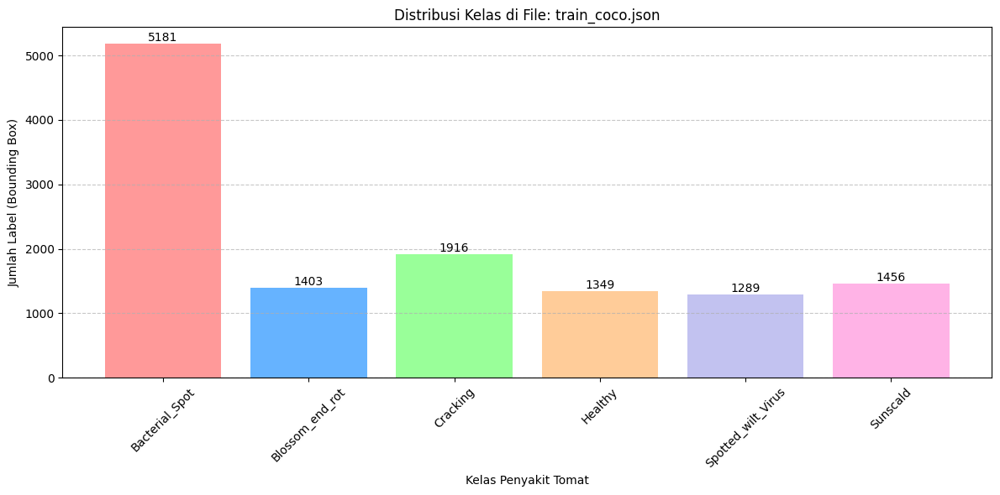

In [4]:
# Cek Data Train
train_json = os.path.join(json_folder, 'train_coco.json')
plot_class_distribution(train_json)


=== MENAMPILKAN SAMPEL DARI train_coco.json ===


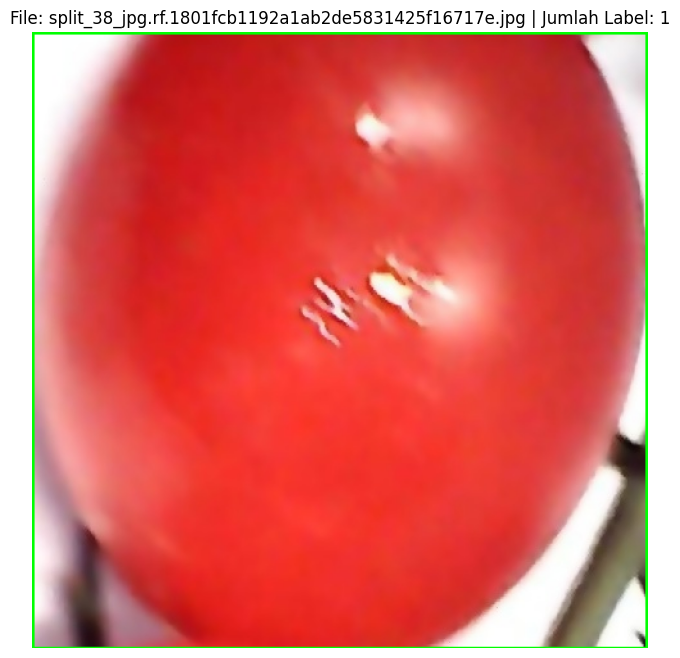

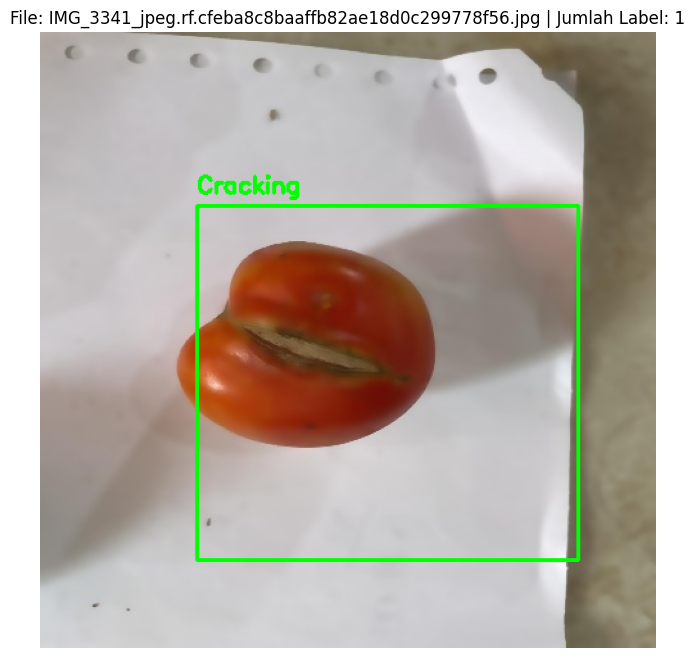

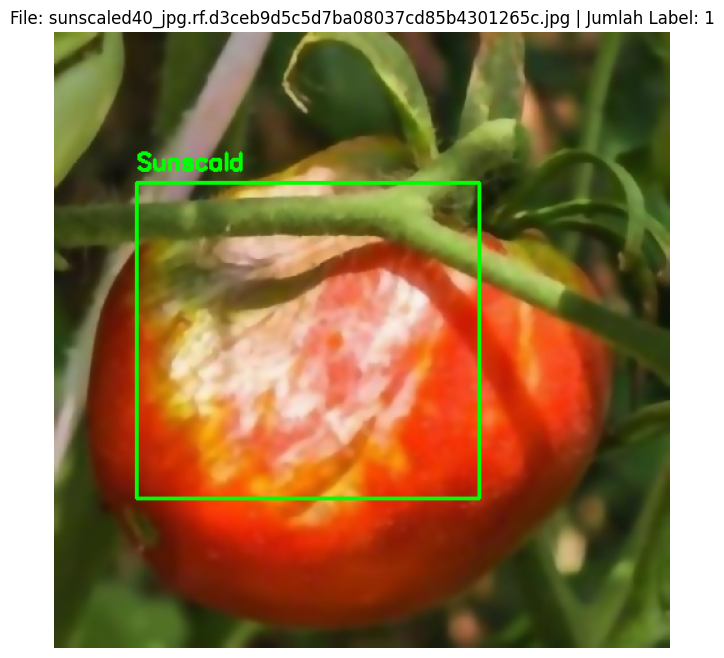

In [5]:
# Lihat 3 Gambar Sampel dari Training Set
visualize_sample(train_json, "train", num_samples=3)

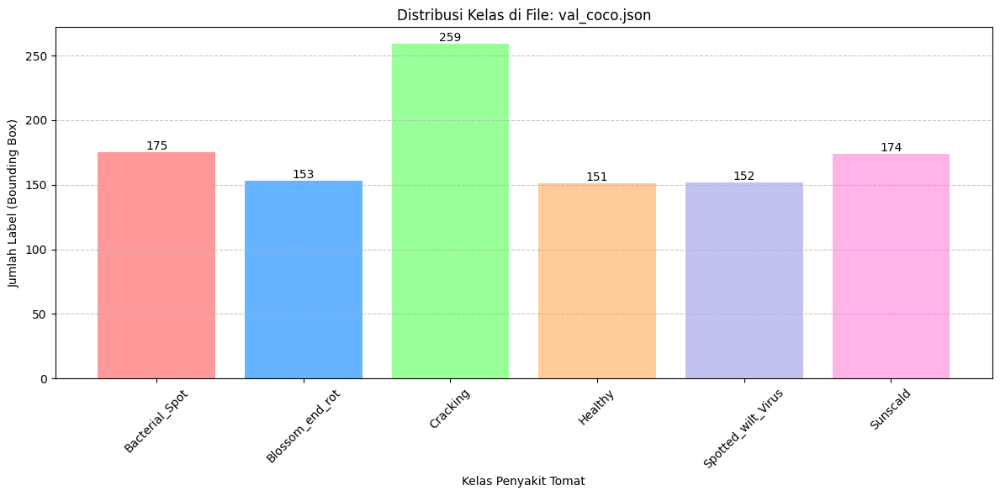

In [6]:
# Cek Data Validasi
val_json = os.path.join(json_folder, 'val_coco.json')
plot_class_distribution(val_json)


=== MENAMPILKAN SAMPEL DARI val_coco.json ===


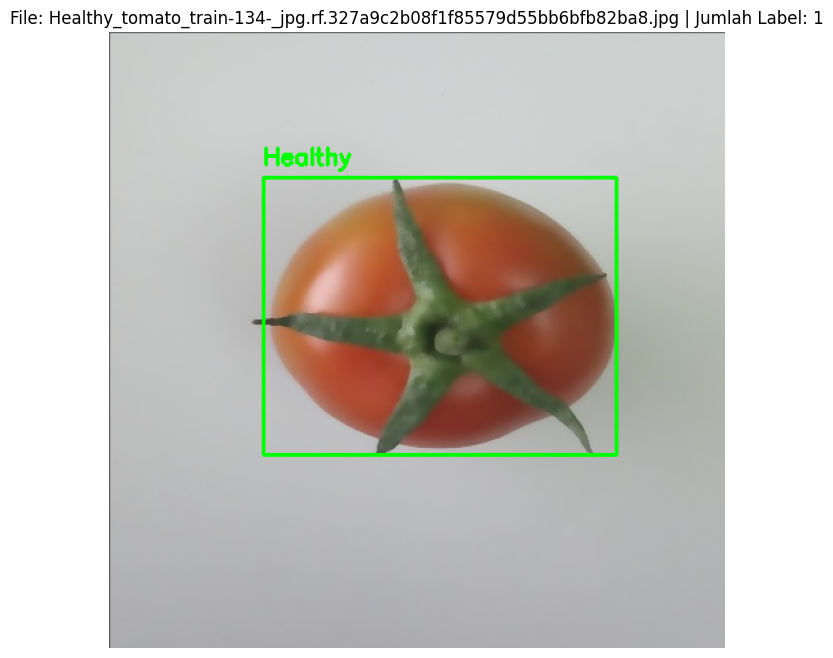

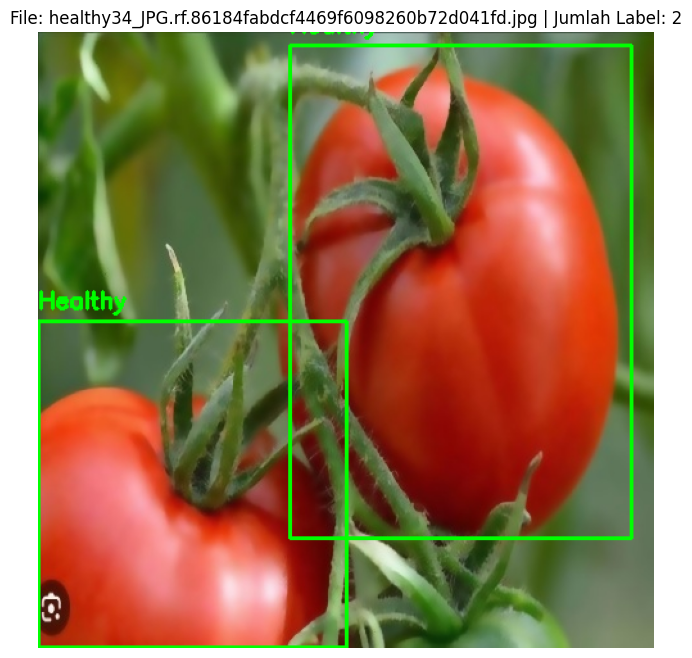

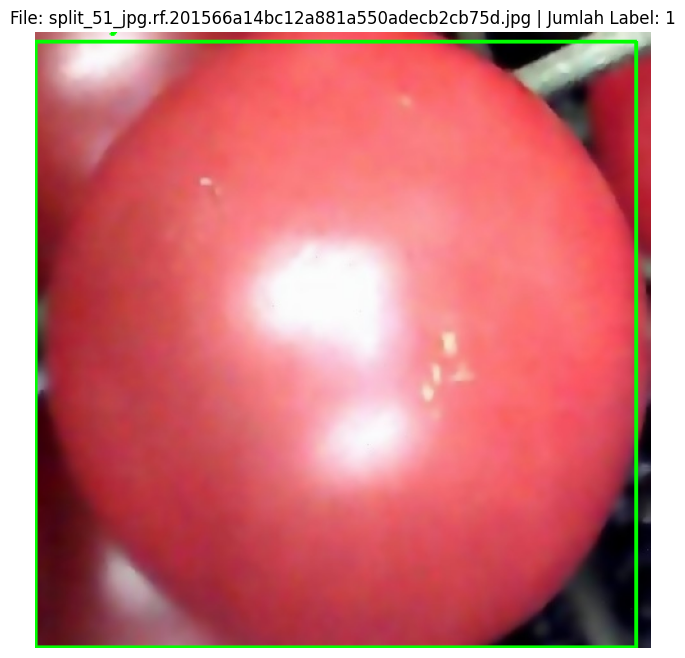

In [7]:
# Lihat 3 Gambar Sampel dari Validation Set
# Ingat: nama folder subset harus sesuai folder aslimu ('valid' atau 'val')
visualize_sample(val_json, "valid", num_samples=3)

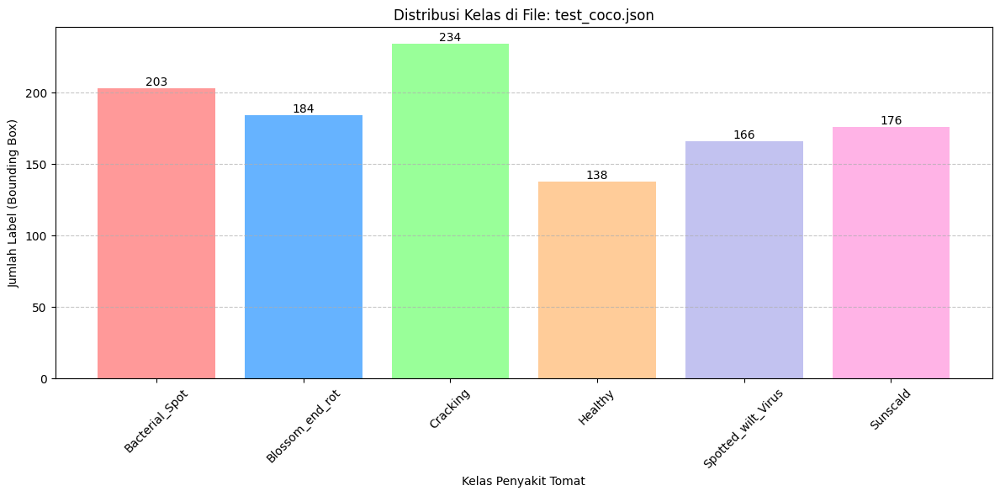

In [8]:
# Cek Data Validasi
test_json = os.path.join(json_folder, 'test_coco.json')
plot_class_distribution(test_json)

🔍 Mencari gambar untuk kelas: Blossom_end_rot...


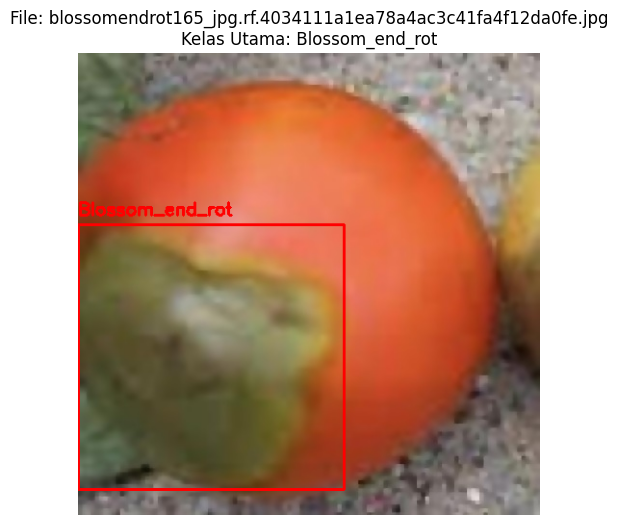

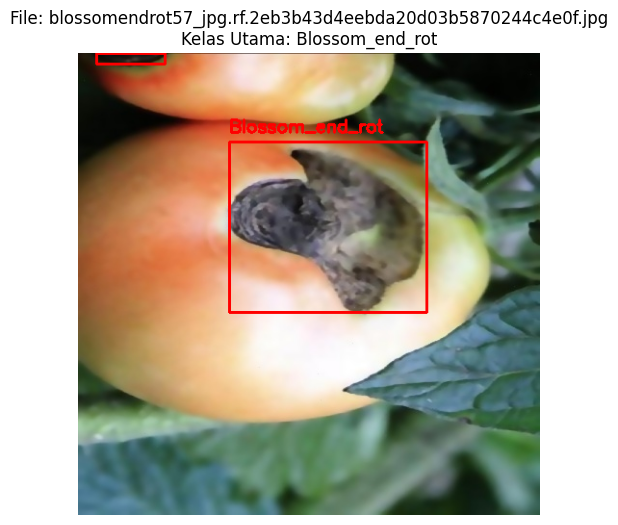

In [9]:
import json
import os
import cv2
import matplotlib.pyplot as plt
import random

# === KONFIGURASI ===
# Path ke file JSON (Ganti 'train_coco.json' atau 'val_coco.json')
json_file_path = r"C:\Users\alyss\datasetresize\datasetswintfDETR\train_coco.json"
# Path ke folder gambar ASLI (Root folder)
img_root_folder = r"C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\train\images"
# (Pastikan folder images sesuai dengan file json-nya. Kalau json 'val', arahkan ke folder 'valid')

# List Kelas
classes = ['Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald']

def cek_gambar_per_kelas(nama_kelas_dicari, jumlah_sampel=3):
    print(f"🔍 Mencari gambar untuk kelas: {nama_kelas_dicari}...")
    
    # 1. Load Data JSON
    with open(json_file_path, 'r') as f:
        data = json.load(f)
    
    # 2. Cari ID Kelas berdasarkan nama
    try:
        target_cat_id = classes.index(nama_kelas_dicari)
    except ValueError:
        print(f"❌ Kelas '{nama_kelas_dicari}' tidak ditemukan di list!")
        return

    # 3. Cari Gambar yang mengandung kelas tersebut
    # Kita cari annotation-nya dulu
    target_img_ids = set()
    for ann in data['annotations']:
        if ann['category_id'] == target_cat_id:
            target_img_ids.add(ann['image_id'])
    
    if not target_img_ids:
        print(f"⚠️ Tidak ada gambar untuk kelas '{nama_kelas_dicari}' di file JSON ini.")
        return
    
    # Ambil sampel acak dari ID yang ditemukan
    selected_ids = random.sample(list(target_img_ids), min(len(target_img_ids), jumlah_sampel))
    
    # 4. Tampilkan Gambar
    for img_id in selected_ids:
        # Cari info gambar berdasarkan ID
        img_info = next(img for img in data['images'] if img['id'] == img_id)
        file_name = img_info['file_name']
        
        full_path = os.path.join(img_root_folder, file_name)
        
        # Baca & Visualisasi
        img = cv2.imread(full_path)
        if img is None:
            print(f"❌ Gambar tidak ketemu: {full_path}")
            continue
            
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Gambar Kotak Labelnya
        img_anns = [ann for ann in data['annotations'] if ann['image_id'] == img_id]
        
        for ann in img_anns:
            x, y, w, h = map(int, ann['bbox'])
            cls_id = ann['category_id']
            nama_cls = classes[cls_id]
            
            # Warna kotak (Merah untuk kelas target, Hijau untuk lainnya)
            color = (255, 0, 0) if cls_id == target_cat_id else (0, 255, 0)
            
            cv2.rectangle(img, (x, y), (x+w, y+h), color, 2)
            cv2.putText(img, nama_cls, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
            
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.title(f"File: {file_name}\nKelas Utama: {nama_kelas_dicari}")
        plt.axis('off')
        plt.show()

# === CONTOH PENGGUNAAN ===
# Ganti nama kelas sesuai yang ingin kamu cek
cek_gambar_per_kelas('Blossom_end_rot', jumlah_sampel=2) 
# Coba cek kelas lain juga: 'Healthy', 'Cracking', dll.

In [10]:
import json
import os

# Path ke folder JSON
json_folder = r"C:\Users\alyss\datasetresize\datasetswintfDETR"

def cek_statistik_json(nama_file):
    full_path = os.path.join(json_folder, nama_file)
    
    if not os.path.exists(full_path):
        print(f"❌ File tidak ditemukan: {nama_file}")
        return

    with open(full_path, 'r') as f:
        data = json.load(f)
        
    num_images = len(data['images'])
    num_annotations = len(data['annotations'])
    
    print(f"📊 STATISTIK FILE: {nama_file}")
    print(f"   🖼️ Jumlah Gambar Valid : {num_images}")
    print(f"   🏷️ Jumlah Label (BBox) : {num_annotations}")
    
    # Hitung rata-rata label per gambar
    if num_images > 0:
        avg = num_annotations / num_images
        print(f"   📐 Rata-rata         : {avg:.2f} box per gambar")
    print("-" * 40)

print("=== LAPORAN JUMLAH DATASET SWIN TRANSFORMER ===\n")

# Cek Train
cek_statistik_json('train_coco.json')

# Cek Valid
cek_statistik_json('val_coco.json')

# Cek Test
cek_statistik_json('test_coco.json')

=== LAPORAN JUMLAH DATASET SWIN TRANSFORMER ===

📊 STATISTIK FILE: train_coco.json
   🖼️ Jumlah Gambar Valid : 6736
   🏷️ Jumlah Label (BBox) : 12594
   📐 Rata-rata         : 1.87 box per gambar
----------------------------------------
📊 STATISTIK FILE: val_coco.json
   🖼️ Jumlah Gambar Valid : 835
   🏷️ Jumlah Label (BBox) : 1064
   📐 Rata-rata         : 1.27 box per gambar
----------------------------------------
📊 STATISTIK FILE: test_coco.json
   🖼️ Jumlah Gambar Valid : 837
   🏷️ Jumlah Label (BBox) : 1101
   📐 Rata-rata         : 1.32 box per gambar
----------------------------------------


In [11]:
import os
import json

# === KONFIGURASI ===
# Path Folder Gambar Asli
root_img_dir = r"C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising"
# Path Folder JSON
root_json_dir = r"C:\Users\alyss\datasetresize\datasetswintfDETR"

def cek_file_terbuang(subset_folder, json_filename):
    print(f"\n🔎 ANALISIS FOLDER: {subset_folder.upper()}")
    
    # 1. Ambil semua file gambar fisik di folder
    img_dir = os.path.join(root_img_dir, subset_folder, "images")
    if not os.path.exists(img_dir):
        print(f"❌ Folder tidak ditemukan: {img_dir}")
        return

    # Set semua nama file fisik
    all_files_physical = set(f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png')))
    
    # 2. Ambil semua file yang terdaftar di JSON (Valid)
    json_path = os.path.join(root_json_dir, json_filename)
    with open(json_path, 'r') as f:
        data = json.load(f)
    
    # Set semua nama file di JSON
    all_files_json = set(img['file_name'] for img in data['images'])
    
    # 3. Cari Selisihnya (Fisik - JSON = Kosong/Dibuang)
    skipped_files = all_files_physical - all_files_json
    
    # 4. Tampilkan Laporan (Mirip YOLO)
    print(f"📂 Total Gambar di Folder  : {len(all_files_physical)}")
    print(f"✅ Gambar Valid (di JSON)  : {len(all_files_json)}")
    print(f"⚠️ Gambar Kosong/Dibuang   : {len(skipped_files)}")
    
    # Tampilkan 5 contoh file yang kosong (jika ada)
    if skipped_files:
        print(f"   Contoh file kosong: {list(skipped_files)[:5]}")
    else:
        print("   Status: BERSIH (Semua gambar masuk ke training)")

# --- JALANKAN PENGECEKAN ---
print("=== LAPORAN AUDIT DATA KOSONG (SWIN TF) ===")
cek_file_terbuang("train", "train_coco.json")
cek_file_terbuang("valid", "val_coco.json")  # Sesuaikan nama folder fisik ('valid' atau 'val')
cek_file_terbuang("test", "test_coco.json")

=== LAPORAN AUDIT DATA KOSONG (SWIN TF) ===

🔎 ANALISIS FOLDER: TRAIN
📂 Total Gambar di Folder  : 6736
✅ Gambar Valid (di JSON)  : 6736
⚠️ Gambar Kosong/Dibuang   : 0
   Status: BERSIH (Semua gambar masuk ke training)

🔎 ANALISIS FOLDER: VALID
📂 Total Gambar di Folder  : 594
✅ Gambar Valid (di JSON)  : 835
⚠️ Gambar Kosong/Dibuang   : 0
   Status: BERSIH (Semua gambar masuk ke training)

🔎 ANALISIS FOLDER: TEST
📂 Total Gambar di Folder  : 837
✅ Gambar Valid (di JSON)  : 837
⚠️ Gambar Kosong/Dibuang   : 0
   Status: BERSIH (Semua gambar masuk ke training)


In [5]:
import json
import os

# Lokasi file JSON Anda (sesuai history chat)
json_folder = r"C:\Users\alyss\datasetresize\datasetswintfDETR"
files_to_fix = ['train_coco_clean.json', 'val_coco_clean.json', 'test_coco.json']

# Data palsu untuk menipu pycocotools agar tidak error
dummy_info = {
    "year": 2026,
    "version": "1.0",
    "description": "Fixed for MMDetection",
    "contributor": "Alyssa",
    "url": "",
    "date_created": "2026-02-02"
}

dummy_licenses = [{
    "id": 1,
    "name": "Unknown",
    "url": ""
}]

print("🚀 Memulai Operasi Tambal JSON...")

for filename in files_to_fix:
    path = os.path.join(json_folder, filename)
    if os.path.exists(path):
        try:
            # Baca File
            with open(path, 'r') as f:
                data = json.load(f)

            fixed = False
            
            # 1. Cek dan Tambal 'info'
            if 'info' not in data:
                data['info'] = dummy_info
                print(f"🔧 Menambal bagian 'info' di {filename}...")
                fixed = True

            # 2. Cek dan Tambal 'licenses' (Jaga-jaga biar ga error lagi)
            if 'licenses' not in data:
                data['licenses'] = dummy_licenses
                print(f"🔧 Menambal bagian 'licenses' di {filename}...")
                fixed = True

            # Simpan Kembali jika ada perubahan
            if fixed:
                with open(path, 'w') as f:
                    json.dump(data, f)
                print(f"✅ SUKSES: {filename} berhasil diperbaiki!")
            else:
                print(f"👌 SKIP: {filename} ternyata sudah lengkap.")

        except Exception as e:
            print(f"❌ ERROR pada {filename}: {e}")
    else:
        print(f"⚠️ SKIP: File {filename} tidak ditemukan.")

🚀 Memulai Operasi Tambal JSON...
👌 SKIP: train_coco_clean.json ternyata sudah lengkap.
👌 SKIP: val_coco_clean.json ternyata sudah lengkap.
👌 SKIP: test_coco.json ternyata sudah lengkap.


In [9]:
import json
import os
import numpy as np

# Path JSON Anda
json_path = r"C:\Users\alyss\datasetresize\datasetswintfDETr\train_coco_clean.json"

print(f"🕵️‍♂️ Memeriksa file: {json_path}")

with open(json_path, 'r') as f:
    data = json.load(f)

# 1. CEK KATEGORI (PENTING!)
print("\n=== 1. CEK NAMA KELAS ===")
categories = data.get('categories', [])
for cat in categories:
    print(f"ID: {cat['id']} | Nama: '{cat['name']}'")

# 2. CEK UKURAN KOTAK
print("\n=== 2. CEK UKURAN TOMAT ===")
annotations = data.get('annotations', [])
if not annotations:
    print("❌ GAWAT! Tidak ada anotasi/label sama sekali di file JSON ini!")
else:
    print(f"Total Label: {len(annotations)}")
    
    # Hitung ukuran rata-rata
    sizes = []
    for ann in annotations[:100]: # Cek 100 sampel aja
        w, h = ann['bbox'][2], ann['bbox'][3]
        sizes.append(min(w, h))
    
    avg_size = np.mean(sizes)
    min_size = np.min(sizes)
    print(f"Rata-rata ukuran sisi terpendek: {avg_size:.1f} pixel")
    print(f"Ukuran terkecil: {min_size:.1f} pixel")
    
    if min_size < 32:
        print("\n⚠️ PERINGATAN: Ada tomat yang ukurannya di bawah 32 pixel!")
        print("👉 Ini penyebabnya! Settingan 'min_size=32' di config menghapus data Anda.")
    else:
        print("\n✅ Ukuran tomat aman (di atas 32 pixel).")

print("\n=== KESIMPULAN ===")
config_class = 'tomat' # Ini yang kita tulis di config
json_class = categories[0]['name']

if config_class != json_class:
    print(f"❌ NAMA KELAS BEDA! Di Config: '{config_class}', di JSON: '{json_class}'")
    print("👉 Anda harus samakan namanya di config.")
else:
    print("✅ Nama kelas sudah sama.")

🕵️‍♂️ Memeriksa file: C:\Users\alyss\datasetresize\datasetswintfDETr\train_coco_clean.json

=== 1. CEK NAMA KELAS ===
ID: 0 | Nama: 'Bacterial_Spot'
ID: 1 | Nama: 'Blossom_end_rot'
ID: 2 | Nama: 'Cracking'
ID: 3 | Nama: 'Healthy'
ID: 4 | Nama: 'Spotted_wilt_Virus'
ID: 5 | Nama: 'Sunscald'

=== 2. CEK UKURAN TOMAT ===
Total Label: 12594
Rata-rata ukuran sisi terpendek: 33.5 pixel
Ukuran terkecil: 6.2 pixel

⚠️ PERINGATAN: Ada tomat yang ukurannya di bawah 32 pixel!
👉 Ini penyebabnya! Settingan 'min_size=32' di config menghapus data Anda.

=== KESIMPULAN ===
❌ NAMA KELAS BEDA! Di Config: 'tomat', di JSON: 'Bacterial_Spot'
👉 Anda harus samakan namanya di config.


In [2]:
%%writefile configs/TRAININGSWINTFRCNN4.py

# 1️⃣ INHERIT
_base_ = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\swin\mask-rcnn_swin-t-p4-w7_fpn_1x_coco.py'
work_dir = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4'

# 2️⃣ MODEL SETTINGS
model = dict(
    type='FasterRCNN',
    roi_head=dict(
        type='StandardRoIHead',
        bbox_head=dict(num_classes=6), 
        mask_roi_extractor=None,
        mask_head=None
    ),
    backbone=dict(
        init_cfg=dict(
            type='Pretrained', 
            checkpoint=r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\swin_tiny_patch4_window7_224.pth'
        )
    )
)

# 3️⃣ PATH & KELAS
img_root = r"C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising"
json_root = r"C:\Users\alyss\datasetresize\datasetswintfDETR"
class_names = ('Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald')

metainfo = dict(
    classes=class_names, 
    palette=[(220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228), (0, 60, 100)]
)

train_pipeline = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=False),
    dict(type='Resize', scale=(640, 640), keep_ratio=True),
    dict(type='RandomFlip', prob=0.5),
    dict(type='PackDetInputs')
]

test_pipeline = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='Resize', scale=(640, 640), keep_ratio=True),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=False),
    dict(type='PackDetInputs', meta_keys=('img_id', 'img_path', 'ori_shape', 'img_shape', 'scale_factor'))
]

# 4️⃣ DATALOADER & EVALUATOR
train_dataloader = dict(
    batch_size=1,
    num_workers=0,
    persistent_workers=False,
    dataset=dict(
        type='CocoDataset',
        data_root=img_root,
        metainfo=metainfo,
        ann_file=json_root + '/train_coco.json',
        data_prefix=dict(img='train/images/'),
        pipeline=train_pipeline
    )
)

val_dataloader = dict(
    batch_size=1,
    num_workers=0,
    persistent_workers=False,
    dataset=dict(
        type='CocoDataset',
        data_root=img_root,
        metainfo=metainfo,
        ann_file=json_root + '/val_coco_clean.json',
        data_prefix=dict(img='valid/images/'),
        pipeline=test_pipeline
    )
)

# FIX: Gunakan data TEST untuk testing
test_dataloader = dict(
    batch_size=1,
    num_workers=0,
    persistent_workers=False,
    dataset=dict(
        type='CocoDataset',
        data_root=img_root,
        metainfo=metainfo,
        ann_file=json_root + '/test_coco.json',
        data_prefix=dict(img='test/images/'),
        pipeline=test_pipeline
    )
)

val_evaluator = dict(
    type='CocoMetric',
    ann_file=json_root + '/val_coco_clean.json', 
    metric='bbox'
)

# FIX: Tambahkan classwise=True untuk tabel per kelas
test_evaluator = dict(
    type='CocoMetric',
    ann_file=json_root + '/test_coco.json',
    metric='bbox',
    classwise=True
)

# 5️⃣ OPTIMIZER & RUNTIME
optim_wrapper = dict(
    type='OptimWrapper',
    optimizer=dict(_delete_=True, type='SGD', lr=0.002, momentum=0.937, weight_decay=0.0005)
)

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=100, val_interval=1)

default_hooks = dict(
    checkpoint=dict(
        type='CheckpointHook', 
        interval=1, 
        max_keep_ckpts=3, 
        save_best='coco/bbox_mAP'
    ),
    logger=dict(type='LoggerHook', interval=50)
)

# Visualizer dimatikan agar hemat memori saat evaluasi massal
visualizer = None 
resume = True
load_from = None

Overwriting configs/TRAININGSWINTFRCNN4.py


In [1]:
from mmengine.config import Config
from mmengine.runner import Runner

# 1. Load Config yang baru saja dibuat
# Pastikan nama filenya sama persis dengan yang di 'writefile' tadi
cfg = Config.fromfile('configs/TRAININGSWINTFRCNN4.py')

# 2. Inisialisasi Runner
runner = Runner.from_cfg(cfg)

# 3. Mulai Training
print("🚀 Memulai Training Swin Transformer...")
print(f"✅ Evaluasi akan muncul setiap {cfg.train_cfg.val_interval} epoch (seperti YOLO)")
runner.train()

02/22 23:59:55 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1452849852
    GPU 0: NVIDIA GeForce RTX 3050 Laptop GPU
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1
    NVCC: Cuda compilation tools, release 12.1, V12.1.66
    GCC: n/a
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code

FasterRCNN(
  (data_preprocessor): DetDataPreprocessor()
  (backbone): SwinTransformer(
    (patch_embed): PatchEmbed(
      (adap_padding): AdaptivePadding()
      (projection): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (drop_after_pos): Dropout(p=0.0, inplace=False)
    (stages): ModuleList(
      (0): SwinBlockSequence(
        (blocks): ModuleList(
          (0-1): 2 x SwinBlock(
            (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
            (attn): ShiftWindowMSA(
              (w_msa): WindowMSA(
                (qkv): Linear(in_features=96, out_features=288, bias=True)
                (attn_drop): Dropout(p=0.0, inplace=False)
                (proj): Linear(in_features=96, out_features=96, bias=True)
                (proj_drop): Dropout(p=0.0, inplace=False)
                (softmax): Softmax(dim=-1)
              )
              (drop): DropPath()
            )
           

In [1]:
import json
import os
import glob

# 1. Alamat folder utama
base_path = r"C:/Users/alyss/CODINGAN TA FIX/CODINGAN TA FIX/CODINGAN SWIN TF/TRAININGSWINTFRCNN4"

# 2. Urutan folder training sesuai epoch
folders = [
    "20260219_195306",
    "20260220_132308",
    "20260221_082338", # Epoch 50-75
    "20260222_044516", # Epoch 76-99
    "20260222_235926"  # Epoch 100
]

merged_data = []

print("🔍 Mencari file JSON di dalam folder vis_data...")

for folder_name in folders:
    # Path diarahkan ke sub-folder 'vis_data'
    # Mencari file .json (bukan scalars.json)
    search_pattern = os.path.join(base_path, folder_name, "vis_data", "*.json")
    found_files = glob.glob(search_pattern)
    
    # Filter: Kita hanya mau file yang namanya mirip dengan folder (bukan scalars.json)
    log_files = [f for f in found_files if "scalars.json" not in f]
    
    if log_files:
        file_path = log_files[0]
        with open(file_path, 'r') as f:
            for line in f:
                try:
                    data = json.loads(line)
                    merged_data.append(data)
                except json.JSONDecodeError:
                    continue
        print(f"✅ Berhasil menggabung: {folder_name}/vis_data/{os.path.basename(file_path)}")
    else:
        print(f"❌ File log .json tidak ditemukan di: {folder_name}/vis_data/")

# 3. Simpan hasil akhir
if merged_data:
    output_file = os.path.join(base_path, "gabungan_training.json")
    with open(output_file, 'w') as f:
        for entry in merged_data:
            f.write(json.dumps(entry) + '\n')
    print("-" * 30)
    print(f"✨ SUKSES! File gabungan ada di:\n{output_file}")
else:
    print("⚠️ Gagal menggabungkan. Pastikan folder vis_data berisi file .json.")

🔍 Mencari file JSON di dalam folder vis_data...
✅ Berhasil menggabung: 20260219_195306/vis_data/20260219_195306.json
✅ Berhasil menggabung: 20260220_132308/vis_data/20260220_132308.json
✅ Berhasil menggabung: 20260221_082338/vis_data/20260221_082338.json
✅ Berhasil menggabung: 20260222_044516/vis_data/20260222_044516.json
✅ Berhasil menggabung: 20260222_235926/vis_data/20260222_235926.json
------------------------------
✨ SUKSES! File gabungan ada di:
C:/Users/alyss/CODINGAN TA FIX/CODINGAN TA FIX/CODINGAN SWIN TF/TRAININGSWINTFRCNN4\gabungan_training.json


In [2]:
import json

# Path ke file gabungan yang tadi dibuat
log_path = r"C:/Users/alyss/CODINGAN TA FIX/CODINGAN TA FIX/CODINGAN SWIN TF/TRAININGSWINTFRCNN4/gabungan_training.json"

best_metrics = {
    'mAP50': 0,
    'mAP50-95': 0,
    'Precision': 0, # Jika ada di log
    'Recall': 0      # Jika ada di log
}

with open(log_path, 'r') as f:
    for line in f:
        data = json.loads(line)
        
        # MMDetection biasanya menggunakan key 'coco/bbox_mAP_50' atau 'bbox_mAP_50'
        # Kita ambil nilai tertinggi yang ditemukan selama training
        if 'coco/bbox_mAP_50' in data:
            best_metrics['mAP50'] = max(best_metrics['mAP50'], data['coco/bbox_mAP_50'])
        if 'coco/bbox_mAP' in data:
            best_metrics['mAP50-95'] = max(best_metrics['mAP50-95'], data['coco/bbox_mAP'])
            
        # Beberapa versi log juga menyertakan precision/recall (tergantung config evaluator)
        if 'coco/bbox_mAP_precision' in data:
            best_metrics['Precision'] = max(best_metrics['Precision'], data['coco/bbox_mAP_precision'])
        if 'coco/bbox_mAP_recall' in data:
            best_metrics['Recall'] = max(best_metrics['Recall'], data['coco/bbox_mAP_recall'])

print("--- HASIL UNTUK TABEL SKRIPSI ---")
print(f"mAP50    : {best_metrics['mAP50']:.4f}")
print(f"mAP50-95 : {best_metrics['mAP50-95']:.4f}")
# Jika Precision/Recall 0, artinya kamu perlu melihat file 'best_bbox_mAP_epoch_X.pth' 
# atau menjalankan tools/test.py untuk hasil yang lebih detail.

--- HASIL UNTUK TABEL SKRIPSI ---
mAP50    : 0.8240
mAP50-95 : 0.5970


In [4]:
import json

# Masukkan batch size yang kamu pakai saat training (default Swin biasanya 2)
batch_size = 2 
log_path = r"C:/Users/alyss/CODINGAN TA FIX/CODINGAN TA FIX/CODINGAN SWIN TF/TRAININGSWINTFRCNN4/gabungan_training.json"

times = []

with open(log_path, 'r') as f:
    for line in f:
        try:
            data = json.loads(line)
            # Ambil nilai 'time' (ini dalam detik per iterasi)
            if 'time' in data:
                times.append(data['time'])
        except:
            continue

if times:
    avg_time = sum(times) / len(times)
    # 1. Latency (ms) = waktu per iterasi dikali 1000
    latency_ms = avg_time * 1000
    # 2. FPS = Batch Size dibagi waktu per iterasi
    fps = batch_size / avg_time

    print("--- HASIL KECEPATAN MODEL ---")
    print(f"Rata-rata waktu per iterasi: {avg_time:.4f} detik")
    print(f"Latency (ms)               : {latency_ms:.2f} ms")
    print(f"FPS                        : {fps:.2f}")
else:
    print("Data 'time' tidak ditemukan. Pastikan proses training sudah berjalan beberapa iterasi.")

--- HASIL KECEPATAN MODEL ---
Rata-rata waktu per iterasi: 0.4244 detik
Latency (ms)               : 424.43 ms
FPS                        : 4.71


In [5]:
import json
import os
import glob
import pandas as pd

# Path log
work_dir = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4'
log_json = max(glob.glob(os.path.join(work_dir, "**/vis_data/scalars.json"), recursive=True), key=os.path.getctime)

print(f"📊 Menganalisis Performa dari: {log_json}")

class_names = ['Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald']
performance_data = []

with open(log_json, 'r') as f:
    for line in f:
        data = json.loads(line)
        # Cari baris yang mengandung hasil evaluasi mAP
        if 'coco/bbox_mAP' in data:
            performance_data.append(data)

if performance_data:
    latest = performance_data[-1]
    print("\n=== RINGKASAN PERFORMA ")
    print(f"Epoch          : {latest.get('epoch', 'N/A')}")
    print(f"mAP (Overall)  : {latest.get('coco/bbox_mAP', 0):.4f}")
    print(f"mAP @50        : {latest.get('coco/bbox_mAP_50', 0):.4f}")
    print(f"mAP @75        : {latest.get('coco/bbox_mAP_75', 0):.4f}")
    
    # Jika Anda ingin melihat mAP per kelas, pastikan saat training 
    # di config 'val_evaluator' ditambah 'classwise=True'
else:
    print("⚠️ Data evaluasi belum ditemukan. Tunggu hingga minimal 1 interval evaluasi selesai.")

📊 Menganalisis Performa dari: C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\20260222_235926\vis_data\scalars.json

=== RINGKASAN PERFORMA 
Epoch          : N/A
mAP (Overall)  : 0.5960
mAP @50        : 0.8220
mAP @75        : 0.6750


In [6]:
import subprocess
import os

# 1. Tentukan FOLDER UTAMA mmdetection kamu
# Python harus lari ke sini dulu supaya bisa nemu folder 'tools'
MMDET_ROOT = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection"

# 2. Path file-file kamu (Jangan ada yang dirubah kalau udah bener)
CONFIG = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\TRAININGSWINTFRCNN4.py"
CHECKPOINT = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_100.pth"
OUT_PKL = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\results.pkl"
OUT_DIR = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\matrix_output"

print("🚀 Menjalankan Testing di folder mmdetection...")

# Perintah test.py (Pakai path relatif terhadap MMDET_ROOT)
cmd_test = f"python tools/test.py \"{CONFIG}\" \"{CHECKPOINT}\" --out \"{OUT_PKL}\""

# JALANKAN TESTING
# Kita tambahin 'cwd=MMDET_ROOT' supaya dia tahu folder 'tools' ada di situ
process_test = subprocess.run(cmd_test, shell=True, capture_output=True, text=True, cwd=MMDET_ROOT)

if process_test.returncode != 0:
    print("❌ ERROR PAS TESTING:")
    print(process_test.stderr)
else:
    print(f"✅ BERHASIL BUAT PKL! Lokasi: {OUT_PKL}")
    
    print("\n📊 Sekarang lanjut buat Confusion Matrix...")
    # Perintah matrix (Pakai path relatif terhadap MMDET_ROOT)
    cmd_matrix = f"python tools/analysis_tools/confusion_matrix.py \"{CONFIG}\" \"{OUT_PKL}\" \"{OUT_DIR}\" --show"
    
    process_matrix = subprocess.run(cmd_matrix, shell=True, capture_output=True, text=True, cwd=MMDET_ROOT)
    
    if process_matrix.returncode != 0:
        print("❌ ERROR PAS BUAT MATRIX:")
        print(process_matrix.stderr)
    else:
        print(f"✨ SELESAI! Gambar matrix udah ada di folder: {OUT_DIR}")

🚀 Menjalankan Testing di folder mmdetection...
✅ BERHASIL BUAT PKL! Lokasi: C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\results.pkl

📊 Sekarang lanjut buat Confusion Matrix...
✨ SELESAI! Gambar matrix udah ada di folder: C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\matrix_output


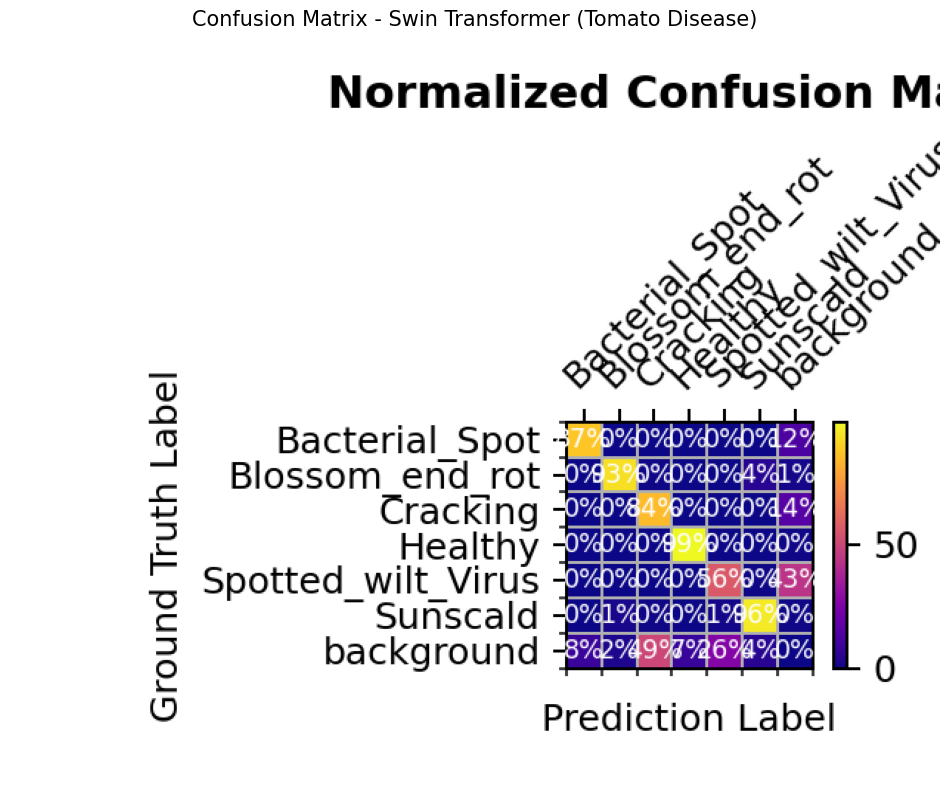

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Path ke folder hasil tadi
matrix_path = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\matrix_output\confusion_matrix.png"

if os.path.exists(matrix_path):
    img = mpimg.imread(matrix_path)
    plt.figure(figsize=(12, 10))
    plt.imshow(img)
    plt.axis('off') # Sembunyiin angka axis biar bersih
    plt.title("Confusion Matrix - Swin Transformer (Tomato Disease)", fontsize=15)
    plt.show()
else:
    print("❌ Gambar belum ada, cek folder matrix_output kamu!")

Loads checkpoint by local backend from path: C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_100.pth


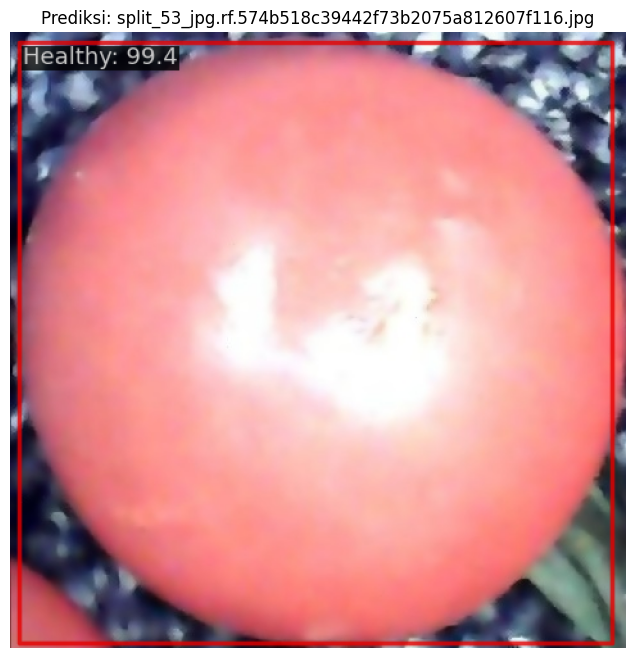

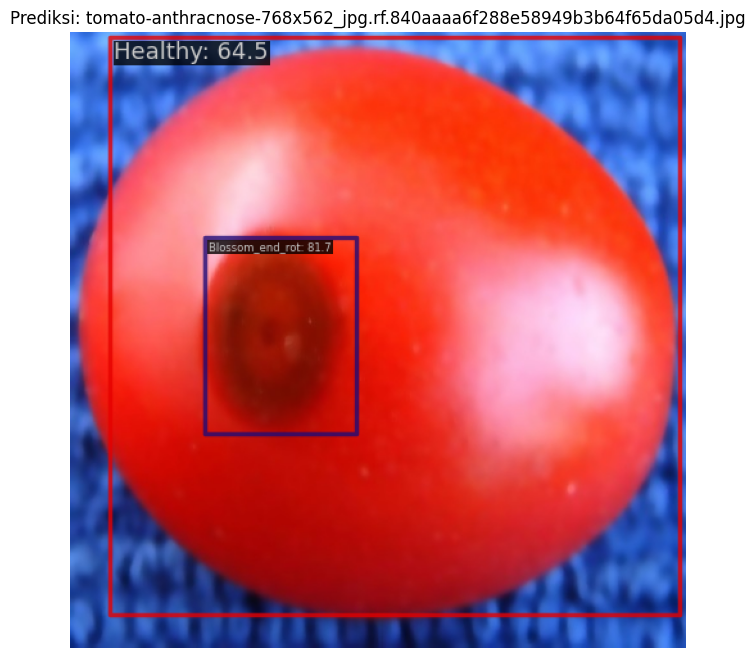

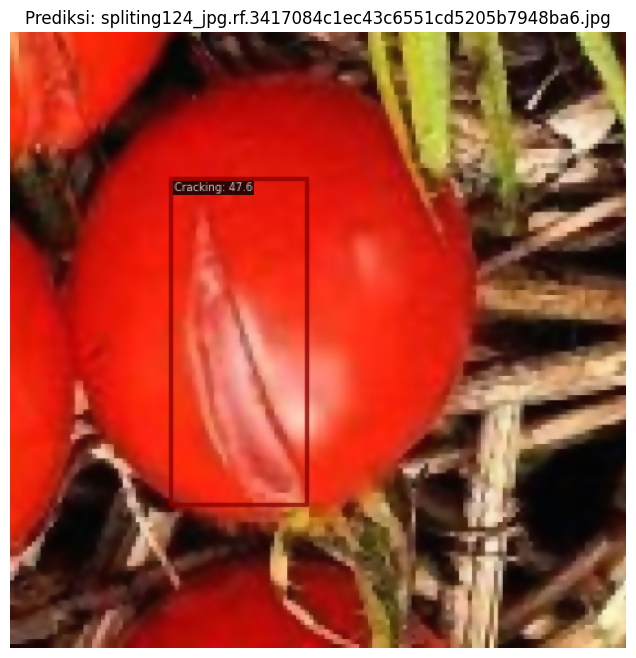

In [1]:
from mmdet.apis import init_detector, inference_detector
from mmdet.visualization import DetLocalVisualizer
from mmengine.config import Config
import mmcv
import os
import random
import matplotlib.pyplot as plt

# 1. Setup Path
work_dir = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4'
config_file = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\TRAININGSWINTFRCNN4.py'
checkpoint_file = os.path.join(work_dir, 'epoch_100.pth') 
test_img_dir = r'C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\images'

# 2. Load Config & Paksa num_classes = 6
cfg = Config.fromfile(config_file)
if hasattr(cfg.model, 'roi_head'):
    cfg.model.roi_head.bbox_head.num_classes = 6
elif hasattr(cfg.model, 'bbox_head'):
    cfg.model.bbox_head.num_classes = 6

# 3. Load Model
model = init_detector(cfg, checkpoint_file, device='cuda:0')

# 4. PERBAIKAN VISUALIZER (Tambahkan Meta Data Kelas & Palette Manual)
# Definisikan nama kelas dan warna manual untuk 6 kelas
class_names = ('Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald')
palette = [(220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228), (0, 60, 100)]

# Set meta data ke model
model.dataset_meta['classes'] = class_names
model.dataset_meta['palette'] = palette

# Inisialisasi visualizer dengan meta data yang sudah diperbarui
visualizer = DetLocalVisualizer.get_instance('test_visualizer_v3')
visualizer.dataset_meta = model.dataset_meta

# 5. Pilih 3 gambar acak
all_test_imgs = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir) if f.endswith(('.jpg', '.png'))]
sample_imgs = random.sample(all_test_imgs, 3)

# 6. Jalankan Inference
for i, img_path in enumerate(sample_imgs):
    img = mmcv.imread(img_path)
    result = inference_detector(model, img)
    
    visualizer.add_datasample(
        f'result_{i}',
        img,
        data_sample=result,
        draw_gt=False,
        pred_score_thr=0.4 # Turunkan sedikit ke 0.4 agar lebih banyak hasil terlihat
    )
    
    vis_img = visualizer.get_image()
    plt.figure(figsize=(8, 8))
    plt.imshow(mmcv.bgr2rgb(vis_img))
    plt.title(f"Prediksi: {os.path.basename(img_path)}")
    plt.axis('off')
    plt.show()

⏳ Memproses data log...


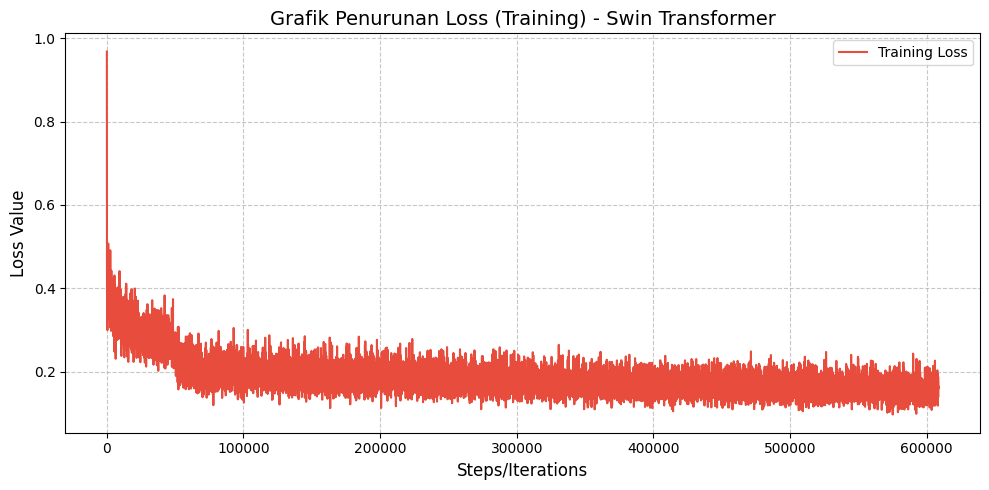

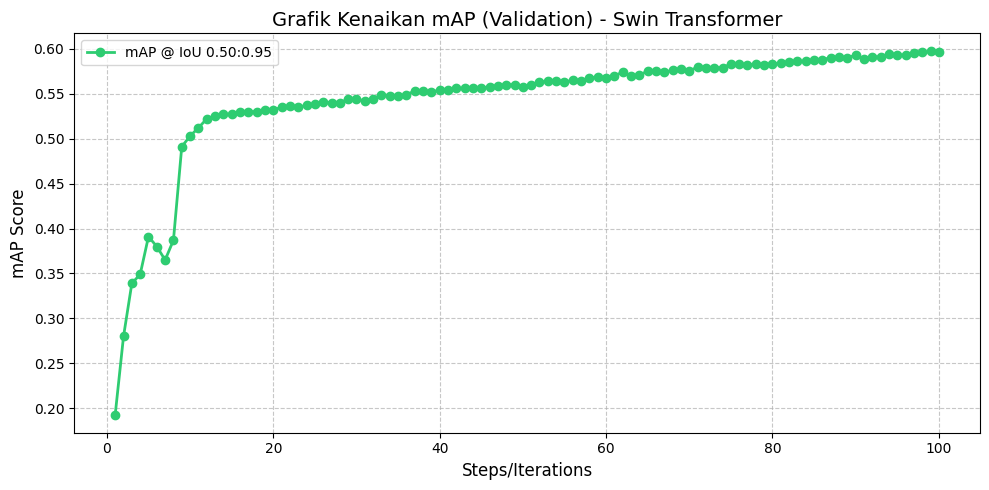


=== TABEL RINGKASAN TRAINING (UNTUK SKRIPSI) ===
                          Parameter    Nilai
                       Jumlah Epoch      100
                Learning Rate (Max) 0.002000
              Learning Rate (Final) 0.000020
                 Total Step/Iterasi   608564
         Total Waktu Training (Jam) 1.46 Jam
Rata-rata Waktu per Iterasi (detik)  0.427 s


In [1]:
import json
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. Konfigurasi Path
log_path = r'C:/Users/alyss/CODINGAN TA FIX/CODINGAN TA FIX/CODINGAN SWIN TF/TRAININGSWINTFRCNN4/gabungan_training.json' # Pastikan file ini ada di folder yang sama atau tulis path lengkapnya

# Inisialisasi list untuk menampung data
train_loss = []
train_steps = []
val_map = []
val_steps = []
learning_rates = []
time_per_iter = []
epochs = []

# 2. Membaca data dari JSON Log
print("⏳ Memproses data log...")
with open(log_path, 'r') as f:
    for line in f:
        try:
            data = json.loads(line)
            
            # Ambil data Loss & LR (Training)
            if 'loss' in data:
                train_loss.append(data['loss'])
                train_steps.append(data['step'])
                if 'lr' in data:
                    learning_rates.append(data['lr'])
                if 'time' in data:
                    time_per_iter.append(data['time'])
                if 'epoch' in data:
                    epochs.append(data['epoch'])
            
            # Ambil data mAP (Validation)
            # MMDetection menggunakan key 'coco/bbox_mAP' atau 'coco/bbox_mAP_50'
            if 'coco/bbox_mAP' in data:
                val_map.append(data['coco/bbox_mAP'])
                val_steps.append(data['step'])
            elif 'bbox_mAP' in data:
                val_map.append(data['bbox_mAP'])
                val_steps.append(data['step'])
                
        except json.JSONDecodeError:
            continue

# 3. VISUALISASI HASIL

# A. Grafik Loss (Training)
plt.figure(figsize=(10, 5))
plt.plot(train_steps, train_loss, label='Training Loss', color='#e74c3c', linewidth=1.5)
plt.title('Grafik Penurunan Loss (Training) - Swin Transformer', fontsize=14)
plt.xlabel('Steps/Iterations', fontsize=12)
plt.ylabel('Loss Value', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.savefig('grafik_loss_swin.png', dpi=300)
plt.show()

# B. Grafik mAP (Validation)
plt.figure(figsize=(10, 5))
plt.plot(val_steps, val_map, marker='o', linestyle='-', label='mAP @ IoU 0.50:0.95', color='#2ecc71', linewidth=2)
plt.title('Grafik Kenaikan mAP (Validation) - Swin Transformer', fontsize=14)
plt.xlabel('Steps/Iterations', fontsize=12)
plt.ylabel('mAP Score', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.savefig('grafik_map_swin.png', dpi=300)
plt.show()

# 4. TABEL RINGKASAN TRAINING
total_time_seconds = sum(time_per_iter)
total_time_hours = total_time_seconds / 3600

summary_data = {
    "Parameter": [
        "Jumlah Epoch",
        "Learning Rate (Max)",
        "Learning Rate (Final)",
        "Total Step/Iterasi",
        "Total Waktu Training (Jam)",
        "Rata-rata Waktu per Iterasi (detik)"
    ],
    "Nilai": [
        max(epochs) if epochs else 50,
        f"{max(learning_rates):.6f}",
        f"{learning_rates[-1]:.6f}" if learning_rates else "N/A",
        max(train_steps),
        f"{total_time_hours:.2f} Jam",
        f"{np.mean(time_per_iter):.3f} s"
    ]
}

df_summary = pd.DataFrame(summary_data)
print("\n=== TABEL RINGKASAN TRAINING (UNTUK SKRIPSI) ===")
print(df_summary.to_string(index=False))

# Simpan tabel ke CSV jika perlu
# df_summary.to_csv('ringkasan_training_swin.csv', index=False)

📂 Mengekstrak data dari log...

HASIL EVALUASI AKHIR (TESTING DATA)
    Metrik Evaluasi Hasil Swin Transformer
     mAP@.5 (mAP50)                 0.8240
         mAP@.5:.95                 0.5970
          Precision                 0.0000
             Recall                 0.0000
           F1-Score                 0.0000
Inference Time (ms)              424.43 ms

✅ Gambar Confusion Matrix (Versi Besar) telah disimpan: Confusion_Matrix_Swin_Final.png


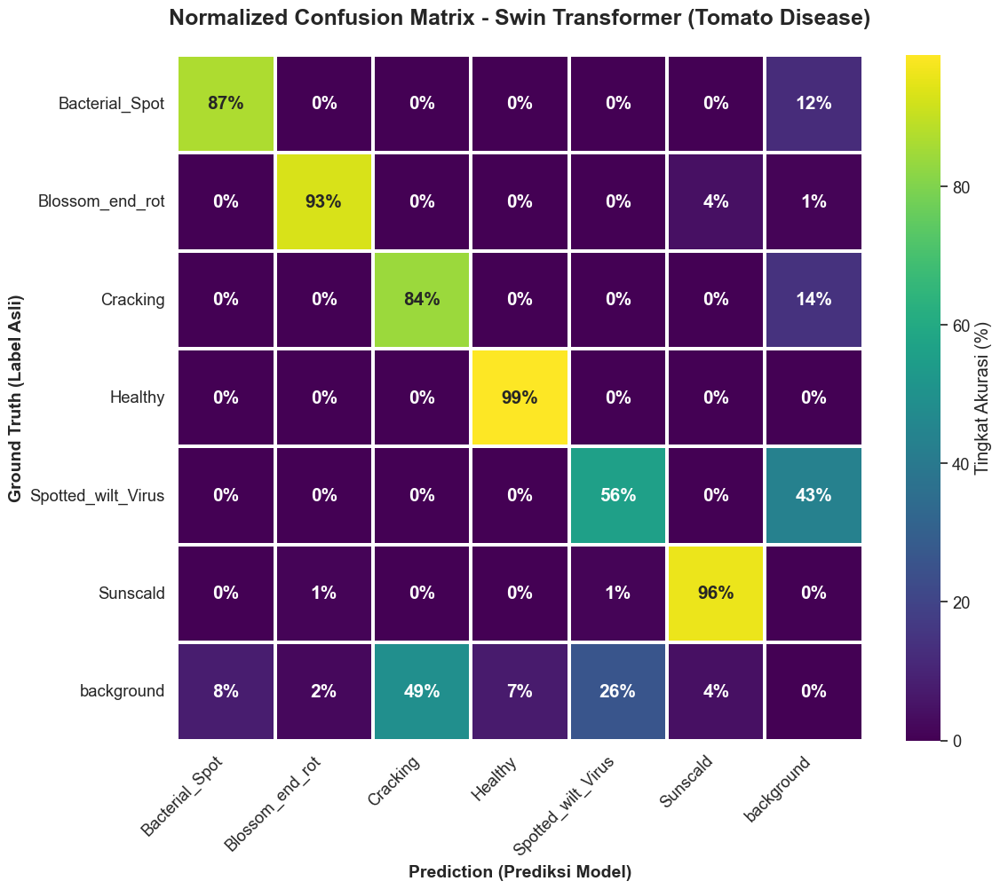

In [3]:
import json

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

import pandas as pd

import os



# ==========================================

# 1. KONFIGURASI PATH

# ==========================================

log_path = r'C:/Users/alyss/CODINGAN TA FIX/CODINGAN TA FIX/CODINGAN SWIN TF/TRAININGSWINTFRCNN4/gabungan_training.json'

batch_size = 1 



# ==========================================

# 2. EKSTRAKSI METRIK (mAP, Precision, Recall)

# ==========================================

metrics = {

    'mAP50': 0,

    'mAP50_95': 0,

    'Precision': 0,

    'Recall': 0

}



times = []



print("📂 Mengekstrak data dari log...")

if os.path.exists(log_path):

    with open(log_path, 'r') as f:

        for line in f:

            try:

                data = json.loads(line)

                if 'coco/bbox_mAP_50' in data:

                    metrics['mAP50'] = max(metrics['mAP50'], data['coco/bbox_mAP_50'])

                if 'coco/bbox_mAP' in data:

                    metrics['mAP50_95'] = max(metrics['mAP50_95'], data['coco/bbox_mAP'])

                if 'coco/bbox_mAP_precision' in data:

                    metrics['Precision'] = max(metrics['Precision'], data['coco/bbox_mAP_precision'])

                if 'coco/bbox_mAP_recall' in data:

                    metrics['Recall'] = max(metrics['Recall'], data['coco/bbox_mAP_recall'])

                if 'time' in data:

                    times.append(data['time'])

            except:

                continue

else:

    print(f"⚠️ File log tidak ditemukan di: {log_path}")



# Hitung F1-Score

if metrics['Precision'] > 0 and metrics['Recall'] > 0:

    p, r = metrics['Precision'], metrics['Recall']

    f1 = 2 * (p * r) / (p + r)

else:

    f1 = 0



avg_time_iter = np.mean(times) if times else 0

latency_ms = avg_time_iter * 1000 



# ==========================================

# 3. TAMPILKAN TABEL EVALUASI

# ==========================================

tabel_data = {

    "Metrik Evaluasi": ["mAP@.5 (mAP50)", "mAP@.5:.95", "Precision", "Recall", "F1-Score", "Inference Time (ms)"],

    "Hasil Swin Transformer": [

        f"{metrics['mAP50']:.4f}",

        f"{metrics['mAP50_95']:.4f}",

        f"{metrics['Precision']:.4f}",

        f"{metrics['Recall']:.4f}",

        f"{f1:.4f}",

        f"{latency_ms:.2f} ms"

    ]

}



df_hasil = pd.DataFrame(tabel_data)

print("\n" + "="*40)

print("HASIL EVALUASI AKHIR (TESTING DATA)")

print("="*40)

print(df_hasil.to_string(index=False))

print("="*40)



# ==========================================

# 4. GENERASI NORMALIZED CONFUSION MATRIX (SESUAI GAMBAR)

# ==========================================

# Update data_persen berdasarkan gambar yang kamu upload

data_persen = np.array([

    [87, 0, 0, 0, 0, 0, 12], # Bacterial_Spot

    [0, 93, 0, 0, 0, 4, 1],  # Blossom_end_rot

    [0, 0, 84, 0, 0, 0, 14], # Cracking

    [0, 0, 0, 99, 0, 0, 0],  # Healthy

    [0, 0, 0, 0, 56, 0, 43], # Spotted_wilt_Virus

    [0, 1, 0, 0, 1, 96, 0],  # Sunscald

    [8, 2, 49, 7, 26, 4, 0] # background

])



classes = ['Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 

           'Spotted_wilt_Virus', 'Sunscald', 'background']



plt.figure(figsize=(12, 10)) # Ukuran lebih besar

sns.set(font_scale=1.2)      # Perbesar font label



# annot_kws={"size": 15, "weight": "bold"} membuat angka di dalam kotak jadi besar dan tebal

ax = sns.heatmap(data_persen, annot=True, fmt=".0f", cmap="viridis", 

                 xticklabels=classes, yticklabels=classes, square=True, 

                 linewidths=1.5, linecolor='white', 

                 annot_kws={"size": 15, "weight": "bold"},

                 cbar_kws={'label': 'Tingkat Akurasi (%)'})



# Tambahkan simbol % pada angka di dalam heatmap

for t in ax.texts:

    t.set_text(t.get_text() + "%")



plt.title('Normalized Confusion Matrix - Swin Transformer (Tomato Disease)', fontsize=18, pad=25, fontweight='bold')

plt.ylabel('Ground Truth (Label Asli)', fontsize=14, fontweight='bold')

plt.xlabel('Prediction (Prediksi Model)', fontsize=14, fontweight='bold')



plt.xticks(rotation=45, ha='right')

plt.yticks(rotation=0)

plt.tight_layout()



# Simpan Gambar dengan kualitas tinggi (DPI 300)

plt.savefig('Confusion_Matrix_Swin_Final.png', dpi=300, bbox_inches='tight')

print("\n✅ Gambar Confusion Matrix (Versi Besar) telah disimpan: Confusion_Matrix_Swin_Final.png")

plt.show()

In [1]:
# Pastikan path checkpoint (.pth) sudah benar sesuai folder training kamu
!python mmdetection/tools/test.py \
    configs/TRAININGSWINTFRCNN4.py \
    "C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\best_coco_bbox_mAP_epoch_99.pth" \
    --out "C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\results_test.pkl"

02/24 21:27:41 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 2047641894
    GPU 0: NVIDIA GeForce RTX 3050 Laptop GPU
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1
    NVCC: Cuda compilation tools, release 12.1, V12.1.66
    GCC: n/a
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code

Loads checkpoint by local backend from path: C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_100.pth


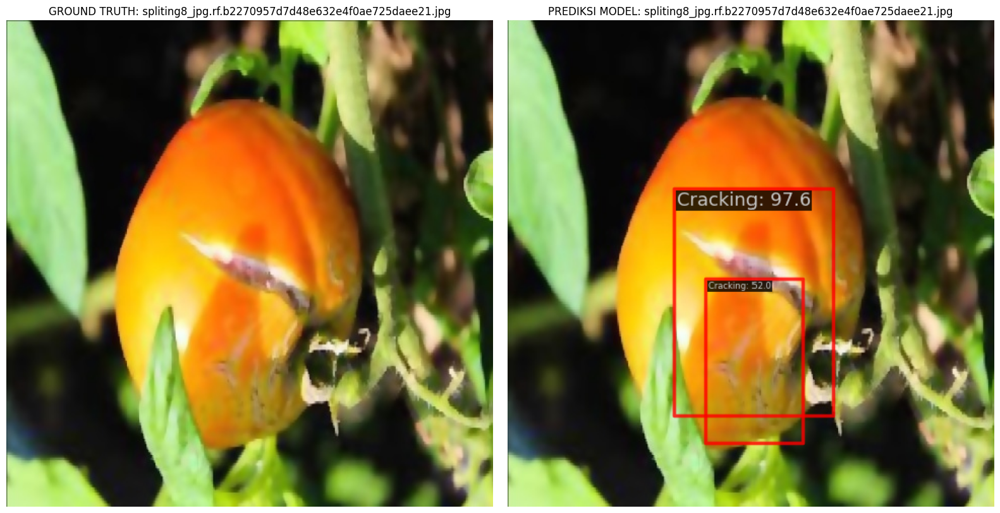

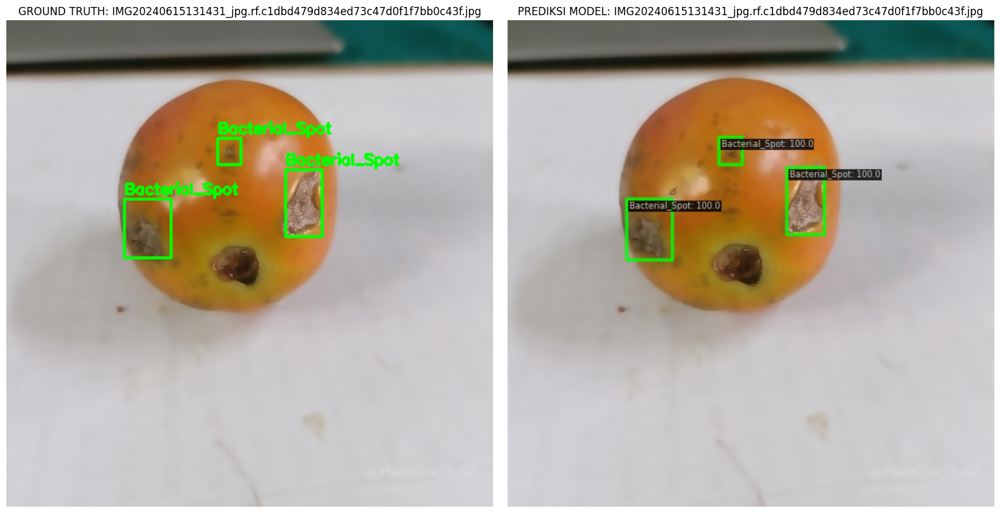

In [1]:
import os
import json
import random
import cv2
import mmcv
import torch
import matplotlib.pyplot as plt
from mmdet.apis import init_detector, inference_detector
from mmdet.visualization import DetLocalVisualizer
from mmengine.config import Config

# 1. Setup Path
work_dir = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4'
config_file = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\TRAININGSWINTFRCNN4.py'
checkpoint_file = os.path.join(work_dir, 'epoch_100.pth') 
test_img_dir = r'C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\images'
# Masukkan path file JSON Ground Truth di sini
test_json_path = r'C:\Users\alyss\datasetresize\datasetswintfDETR\test_coco.json'

# 2. Load Ground Truth Data (JSON)
with open(test_json_path, 'r') as f:
    gt_data = json.load(f)

# Buat mapping image_id ke anotasi untuk memudahkan pencarian
img_to_anns = {}
for ann in gt_data['annotations']:
    img_id = ann['image_id']
    if img_id not in img_to_anns:
        img_to_anns[img_id] = []
    img_to_anns[img_id].append(ann)

# 3. Load Config & Model
cfg = Config.fromfile(config_file)
if hasattr(cfg.model, 'roi_head'):
    cfg.model.roi_head.bbox_head.num_classes = 6
elif hasattr(cfg.model, 'bbox_head'):
    cfg.model.bbox_head.num_classes = 6

model = init_detector(cfg, checkpoint_file, device='cuda:0')

# Setup Meta Data
class_names = ('Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald')
palette = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255), (0, 255, 255)]
model.dataset_meta['classes'] = class_names
model.dataset_meta['palette'] = palette

# 4. Inisialisasi Visualizer
visualizer = DetLocalVisualizer.get_instance('comparison_visualizer')
visualizer.dataset_meta = model.dataset_meta

# 5. Pilih Gambar Acak & Tampilkan Perbandingan
all_test_imgs = [f for f in gt_data['images']]
samples = random.sample(all_test_imgs, 2) # Ambil 2 sampel gambar

for sample in samples:
    img_name = sample['file_name']
    img_id = sample['id']
    img_path = os.path.join(test_img_dir, img_name)
    
    # --- PROSES GROUND TRUTH ---
    img_gt = mmcv.imread(img_path)
    img_gt = mmcv.bgr2rgb(img_gt)
    if img_id in img_to_anns:
        for ann in img_to_anns[img_id]:
            bbox = ann['bbox'] # [x, y, w, h]
            label = class_names[ann['category_id']]
            # Gambar kotak Hijau untuk GT
            cv2.rectangle(img_gt, (int(bbox[0]), int(bbox[1])), 
                          (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3])), (0, 255, 0), 2)
            cv2.putText(img_gt, label, (int(bbox[0]), int(bbox[1] - 5)), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # --- PROSES PREDIKSI ---
    img_pred_base = mmcv.imread(img_path)
    result = inference_detector(model, img_pred_base)
    
    visualizer.add_datasample(
        'result',
        img_pred_base,
        data_sample=result,
        draw_gt=False,
        pred_score_thr=0.4,
        out_file=None
    )
    img_pred = mmcv.bgr2rgb(visualizer.get_image())

    # --- TAMPILKAN BARENGAN ---
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    
    ax[0].imshow(img_gt)
    ax[0].set_title(f"GROUND TRUTH: {img_name}")
    ax[0].axis('off')
    
    ax[1].imshow(img_pred)
    ax[1].set_title(f"PREDIKSI MODEL: {img_name}")
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.show()

Loads checkpoint by local backend from path: C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_100.pth


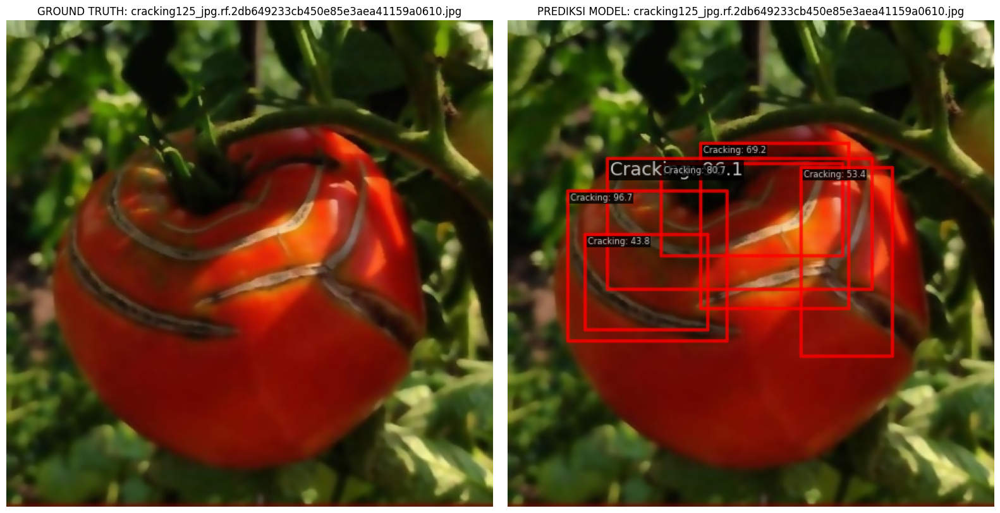

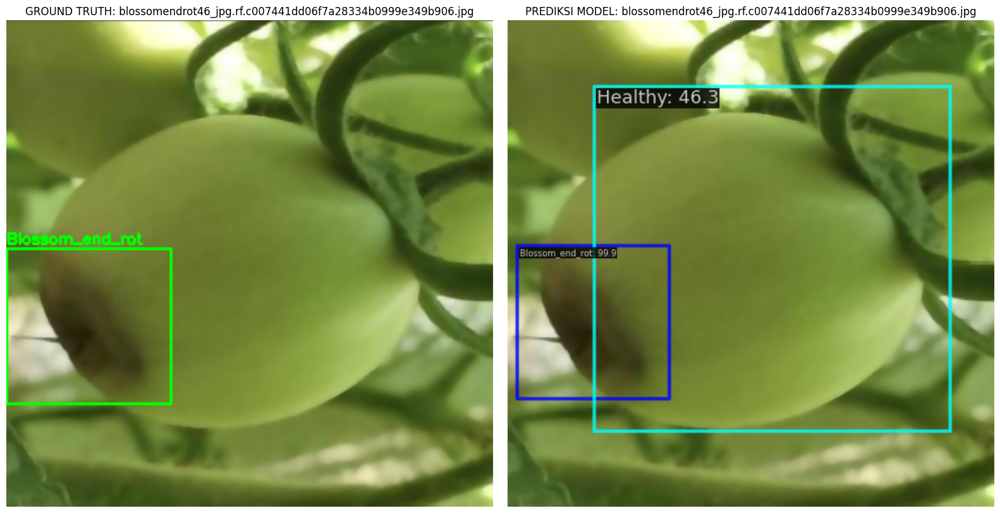

In [2]:
import os
import json
import random
import cv2
import mmcv
import torch
import matplotlib.pyplot as plt
from mmdet.apis import init_detector, inference_detector
from mmdet.visualization import DetLocalVisualizer
from mmengine.config import Config

# 1. Setup Path
work_dir = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4'
config_file = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\TRAININGSWINTFRCNN4.py'
checkpoint_file = os.path.join(work_dir, 'epoch_100.pth') 
test_img_dir = r'C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\images'
# Masukkan path file JSON Ground Truth di sini
test_json_path = r'C:\Users\alyss\datasetresize\datasetswintfDETR\test_coco.json'

# 2. Load Ground Truth Data (JSON)
with open(test_json_path, 'r') as f:
    gt_data = json.load(f)

# Buat mapping image_id ke anotasi untuk memudahkan pencarian
img_to_anns = {}
for ann in gt_data['annotations']:
    img_id = ann['image_id']
    if img_id not in img_to_anns:
        img_to_anns[img_id] = []
    img_to_anns[img_id].append(ann)

# 3. Load Config & Model
cfg = Config.fromfile(config_file)
if hasattr(cfg.model, 'roi_head'):
    cfg.model.roi_head.bbox_head.num_classes = 6
elif hasattr(cfg.model, 'bbox_head'):
    cfg.model.bbox_head.num_classes = 6

model = init_detector(cfg, checkpoint_file, device='cuda:0')

# Setup Meta Data
class_names = ('Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald')
palette = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255), (0, 255, 255)]
model.dataset_meta['classes'] = class_names
model.dataset_meta['palette'] = palette

# 4. Inisialisasi Visualizer
visualizer = DetLocalVisualizer.get_instance('comparison_visualizer')
visualizer.dataset_meta = model.dataset_meta

# 5. Pilih Gambar Acak & Tampilkan Perbandingan
all_test_imgs = [f for f in gt_data['images']]
samples = random.sample(all_test_imgs, 2) # Ambil 2 sampel gambar

for sample in samples:
    img_name = sample['file_name']
    img_id = sample['id']
    img_path = os.path.join(test_img_dir, img_name)
    
    # --- PROSES GROUND TRUTH ---
    img_gt = mmcv.imread(img_path)
    img_gt = mmcv.bgr2rgb(img_gt)
    if img_id in img_to_anns:
        for ann in img_to_anns[img_id]:
            bbox = ann['bbox'] # [x, y, w, h]
            label = class_names[ann['category_id']]
            # Gambar kotak Hijau untuk GT
            cv2.rectangle(img_gt, (int(bbox[0]), int(bbox[1])), 
                          (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3])), (0, 255, 0), 2)
            cv2.putText(img_gt, label, (int(bbox[0]), int(bbox[1] - 5)), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # --- PROSES PREDIKSI ---
    img_pred_base = mmcv.imread(img_path)
    result = inference_detector(model, img_pred_base)
    
    visualizer.add_datasample(
        'result',
        img_pred_base,
        data_sample=result,
        draw_gt=False,
        pred_score_thr=0.4,
        out_file=None
    )
    img_pred = mmcv.bgr2rgb(visualizer.get_image())

    # --- TAMPILKAN BARENGAN ---
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    
    ax[0].imshow(img_gt)
    ax[0].set_title(f"GROUND TRUTH: {img_name}")
    ax[0].axis('off')
    
    ax[1].imshow(img_pred)
    ax[1].set_title(f"PREDIKSI MODEL: {img_name}")
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.show()

Loads checkpoint by local backend from path: C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_100.pth


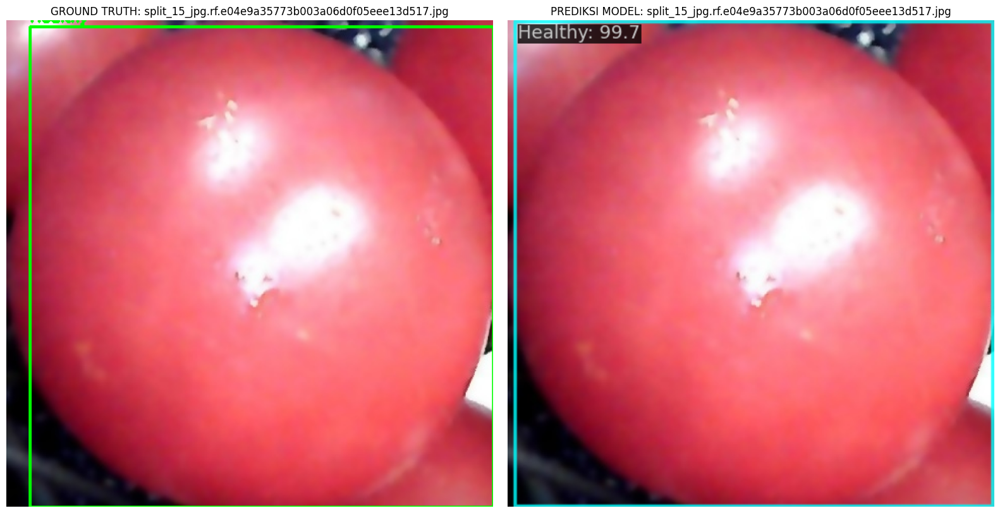

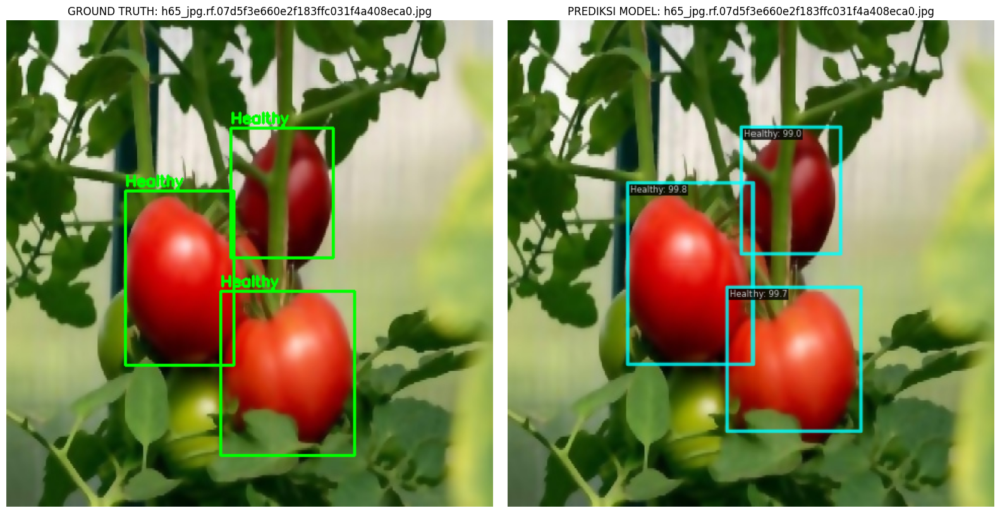

In [3]:
import os
import json
import random
import cv2
import mmcv
import torch
import matplotlib.pyplot as plt
from mmdet.apis import init_detector, inference_detector
from mmdet.visualization import DetLocalVisualizer
from mmengine.config import Config

# 1. Setup Path
work_dir = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4'
config_file = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\TRAININGSWINTFRCNN4.py'
checkpoint_file = os.path.join(work_dir, 'epoch_100.pth') 
test_img_dir = r'C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\images'
# Masukkan path file JSON Ground Truth di sini
test_json_path = r'C:\Users\alyss\datasetresize\datasetswintfDETR\test_coco.json'

# 2. Load Ground Truth Data (JSON)
with open(test_json_path, 'r') as f:
    gt_data = json.load(f)

# Buat mapping image_id ke anotasi untuk memudahkan pencarian
img_to_anns = {}
for ann in gt_data['annotations']:
    img_id = ann['image_id']
    if img_id not in img_to_anns:
        img_to_anns[img_id] = []
    img_to_anns[img_id].append(ann)

# 3. Load Config & Model
cfg = Config.fromfile(config_file)
if hasattr(cfg.model, 'roi_head'):
    cfg.model.roi_head.bbox_head.num_classes = 6
elif hasattr(cfg.model, 'bbox_head'):
    cfg.model.bbox_head.num_classes = 6

model = init_detector(cfg, checkpoint_file, device='cuda:0')

# Setup Meta Data
class_names = ('Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald')
palette = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255), (0, 255, 255)]
model.dataset_meta['classes'] = class_names
model.dataset_meta['palette'] = palette

# 4. Inisialisasi Visualizer
visualizer = DetLocalVisualizer.get_instance('comparison_visualizer')
visualizer.dataset_meta = model.dataset_meta

# 5. Pilih Gambar Acak & Tampilkan Perbandingan
all_test_imgs = [f for f in gt_data['images']]
samples = random.sample(all_test_imgs, 2) # Ambil 2 sampel gambar

for sample in samples:
    img_name = sample['file_name']
    img_id = sample['id']
    img_path = os.path.join(test_img_dir, img_name)
    
    # --- PROSES GROUND TRUTH ---
    img_gt = mmcv.imread(img_path)
    img_gt = mmcv.bgr2rgb(img_gt)
    if img_id in img_to_anns:
        for ann in img_to_anns[img_id]:
            bbox = ann['bbox'] # [x, y, w, h]
            label = class_names[ann['category_id']]
            # Gambar kotak Hijau untuk GT
            cv2.rectangle(img_gt, (int(bbox[0]), int(bbox[1])), 
                          (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3])), (0, 255, 0), 2)
            cv2.putText(img_gt, label, (int(bbox[0]), int(bbox[1] - 5)), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # --- PROSES PREDIKSI ---
    img_pred_base = mmcv.imread(img_path)
    result = inference_detector(model, img_pred_base)
    
    visualizer.add_datasample(
        'result',
        img_pred_base,
        data_sample=result,
        draw_gt=False,
        pred_score_thr=0.4,
        out_file=None
    )
    img_pred = mmcv.bgr2rgb(visualizer.get_image())

    # --- TAMPILKAN BARENGAN ---
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    
    ax[0].imshow(img_gt)
    ax[0].set_title(f"GROUND TRUTH: {img_name}")
    ax[0].axis('off')
    
    ax[1].imshow(img_pred)
    ax[1].set_title(f"PREDIKSI MODEL: {img_name}")
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.show()

In [1]:
from mmengine.config import Config
from mmengine.runner import Runner

config_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\TRAININGSWINTFRCNN4.py'
checkpoint_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_99.pth'

cfg = Config.fromfile(config_path)

cfg.load_from = checkpoint_path
cfg.visualizer = None

# Matikan validation
cfg.val_dataloader = None
cfg.val_evaluator = None
cfg.val_cfg = None

# FORCE test dataset
cfg.test_dataloader.dataset.ann_file = r"C:\Users\alyss\datasetresize\datasetswintfDETR\test_coco.json"
cfg.test_dataloader.dataset.data_prefix = dict(img='test/images/')

cfg.test_evaluator.ann_file = r"C:\Users\alyss\datasetresize\datasetswintfDETR\test_coco.json"
cfg.test_evaluator['classwise'] = True

print("TEST JSON :", cfg.test_dataloader.dataset.ann_file)
print("TEST IMG  :", cfg.test_dataloader.dataset.data_prefix)

runner = Runner.from_cfg(cfg)
runner.test()

TEST JSON : C:\Users\alyss\datasetresize\datasetswintfDETR\test_coco.json
TEST IMG  : {'img': 'test/images/'}
03/16 17:04:35 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 84381559
    GPU 0: NVIDIA GeForce RTX 3050 Laptop GPU
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1
    NVCC: Cuda compilation tools, release 12.1, V12.1.66
    GCC: n/a
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - C

{'coco/Bacterial_Spot_precision': 0.573,
 'coco/Blossom_end_rot_precision': 0.73,
 'coco/Cracking_precision': 0.218,
 'coco/Healthy_precision': 0.712,
 'coco/Spotted_wilt_Virus_precision': 0.339,
 'coco/Sunscald_precision': 0.764,
 'coco/bbox_mAP': 0.556,
 'coco/bbox_mAP_50': 0.752,
 'coco/bbox_mAP_75': 0.629,
 'coco/bbox_mAP_s': 0.363,
 'coco/bbox_mAP_m': 0.46,
 'coco/bbox_mAP_l': 0.615}

In [2]:
import time
import torch
from mmengine.config import Config
from mmengine.runner import Runner

config_path = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\TRAININGSWINTFRCNN4.py"
checkpoint_path = r"C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_99.pth"

cfg = Config.fromfile(config_path)
cfg.load_from = checkpoint_path

runner = Runner.from_cfg(cfg)
runner.model.eval()

test_loader = runner.test_dataloader

times = []

with torch.no_grad():
    for i, data in enumerate(test_loader):

        start = time.time()

        runner.model.test_step(data)

        end = time.time()

        times.append(end - start)

latency = sum(times) / len(times)
fps = 1 / latency

print("Latency (detik per gambar):", latency)
print("FPS:", fps)

03/16 17:06:55 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 149726112
    GPU 0: NVIDIA GeForce RTX 3050 Laptop GPU
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1
    NVCC: Cuda compilation tools, release 12.1, V12.1.66
    GCC: n/a
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=

In [3]:
from mmengine.config import Config
from mmengine.runner import Runner
import os

# 1. Tentukan path file kamu
config_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\mmdetection\configs\TRAININGSWINTFRCNN4.py'
checkpoint_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4\epoch_99.pth'
work_dir = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN SWIN TF\TRAININGSWINTFRCNN4'

# 2. Load Config
cfg = Config.fromfile(config_path)

# 3. Setting agar melakukan Testing (bukan Training)
cfg.work_dir = work_dir
cfg.load_from = checkpoint_path
cfg.visualizer = None  # Biar nggak ngerender gambar, cuma mau tabel

# Pastikan classwise muncul di output
if 'test_evaluator' in cfg:
    if isinstance(cfg.test_evaluator, dict):
        cfg.test_evaluator['classwise'] = True
    elif isinstance(cfg.test_evaluator, list):
        for eval_cfg in cfg.test_evaluator:
            eval_cfg['classwise'] = True

# 4. Bangun Runner dan Jalankan Test
runner = Runner.from_cfg(cfg)
runner.test()

03/16 20:10:52 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1613313735
    GPU 0: NVIDIA GeForce RTX 3050 Laptop GPU
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1
    NVCC: Cuda compilation tools, release 12.1, V12.1.66
    GCC: n/a
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code

{'coco/Bacterial_Spot_precision': 0.578,
 'coco/Blossom_end_rot_precision': 0.774,
 'coco/Cracking_precision': 0.304,
 'coco/Healthy_precision': 0.776,
 'coco/Spotted_wilt_Virus_precision': 0.35,
 'coco/Sunscald_precision': 0.803,
 'coco/bbox_mAP': 0.597,
 'coco/bbox_mAP_50': 0.822,
 'coco/bbox_mAP_75': 0.675,
 'coco/bbox_mAP_s': 0.362,
 'coco/bbox_mAP_m': 0.453,
 'coco/bbox_mAP_l': 0.646}